# Multilayer graph modeling of gene expression data

In this notebook you will find the code for multilayer graph gene classification.

In order to replicate the results you need to:
- download the necessary libraries 
- download the CHIP-seq data following Chromoformer pre-procesing pipeline
- download the co-expression database Coexpressdb

In this notebook you will able to replicate ALL stepps of the experiments.

If you wish to apply the code to your own data, you just need to replace the CHIP-seq data with your own.

Please, ensure that the data outputed from Chromoformer have the following format: "{chrom}\_{start_window}\_{end_window}.npy". Otherwise, you will need to correct accordingly the code.

*note*: it will be necessary to change pathways and computer-specific variables in the second cell so that the code will work

# Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
from pathlib import Path
import mygene
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from scipy import stats
from scipy.stats import pearsonr 
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV, PredefinedSplit
from sklearn.metrics import make_scorer
from lightgbm import LGBMRegressor
from sklearn.utils import shuffle
import ast
from statsmodels.stats.multitest import multipletests
from scipy.stats import spearmanr
from scipy.stats import ttest_ind
import torch
from tqdm import tqdm
import torch.nn as nn
from ast import literal_eval
from xgboost import XGBClassifier
import matplotlib.patches as mpatches
from matplotlib.colors import TwoSlopeNorm, LinearSegmentedColormap
import pickle
import torch.nn.functional as F
from torch.nn import Linear
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GCNConv, GATConv, GATv2Conv, global_mean_pool
from torch_geometric.data import Data
import random
from torch.nn import Linear, GELU, Sequential, BatchNorm1d, Dropout
from torch_geometric.nn import (
    GINEConv, JumpingKnowledge,
    global_mean_pool, global_max_pool
)
from copy import deepcopy
import networkx as nx
from matplotlib import cm
from torch_geometric.utils import to_networkx
from matplotlib.patches import Patch

# Setup

### Change here all directories and paramenters according to your settings

In [ ]:
"""
PARAMETERS TO MODIFY

this code is implemented such that, once you adjust these parameters, you can launch all the code
"""
# ==== Device ====
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# === GENERAL PARAMETERS ===

#this is the path to the file outputed by chromoformer
#info_data = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/chromexpress-master/chromoformer/preprocessing/train.csv") 

#select the cell line:
#cell_line = "E003"
#cell_line = "E066"
#cell_line = "E116"

#this is the path to the folder containing all the coexpressed genes (from the coexpress.db database)
#folder_path = "C:/Users/stefa/OneDrive/Desktop/Hsa-u.v22-05.G16651-S245698.combat_pca.subagging.z.d"

# this is the path to the folder containing all CHIP-seq data outputed by chromoformer
#base_path = 'C:/Users/stefa/OneDrive/desktop/chromexpress-master/chromoformer/preprocessing/data/E003'
#base_path = 'C:/Users/stefa/OneDrive/desktop/chromexpress-master/chromoformer/preprocessing/data/E066'
#base_path = 'C:/Users/stefa/OneDrive/desktop/chromexpress-master/chromoformer/preprocessing/data/E116'

# ======================

# === GNN PARAMETERS ===
np.random.seed(42)
torch.manual_seed(42)

hidden_channels = 256
num_layers      = 2
dropout_p       = 0.30
batch_size      = 64
lr              = 1e-4
weight_decay    = 5e-5
num_folds       = 4
max_epochs      = 30
early_patience  = 20           
val_frac        = 0.15
dropedge_p      = 0.1         
clip_grad_norm  = 1.0
# ===================

# Visualize Data

Estrazione della finestra genomica per il gene ENSG00000000419:
Coordinate: chr20:49555101-49595101 (Strand: -)


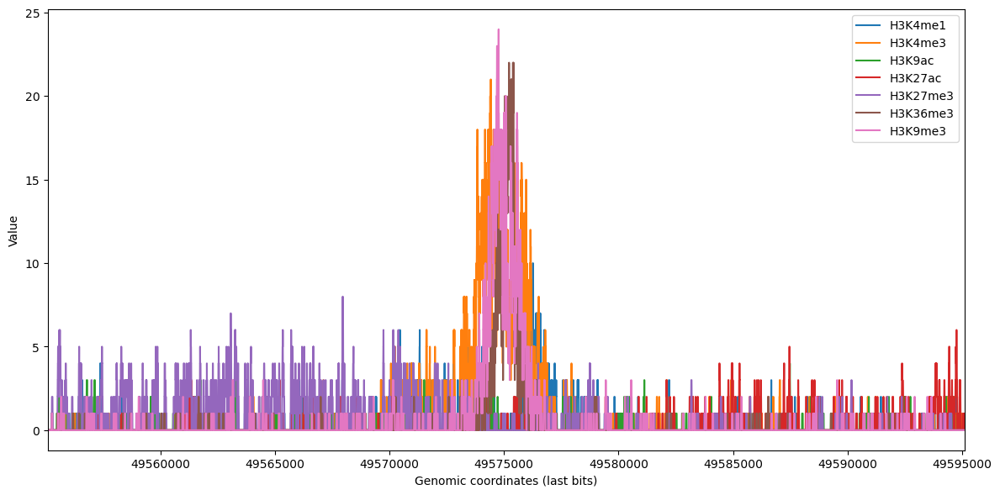

In [ ]:
# PUT HERE THE INFORMATION OF THE GENE
gene_id = 'ENSG00000000419'
chrom = 'chr20'
start = 49575101  # posizione di inizio del gene
end = 49575102	    # posizione di fine del gene
strand = '-'     # direzione del gene (negativo)

###############################################################à

start_window = start - 20000
end_window = start + 20000

print(f"Estrazione della finestra genomica per il gene {gene_id}:")
print(f"Coordinate: {chrom}:{start_window}-{end_window} (Strand: {strand})")

file_path = f'C:/Users/stefa/OneDrive/desktop/chromexpress-master/chromoformer/preprocessing/data/E003/{chrom}_{start_window}_{end_window}.npy'

data = np.load(file_path)

########################################################
########################################################
########################################################

num_segments = data.shape[1]
genomic_positions = np.linspace(start_window, end_window, num_segments, dtype=int)

#plot
plt.figure(figsize=(12, 6))
modifiche_istone = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]

for i in range(data.shape[0]):  # Per ogni tipo di modifica istonica
    plt.plot(genomic_positions, data[i, :], label=f'{modifiche_istone[i]}')

plt.ticklabel_format(style='plain', axis='x')

xticks = plt.xticks()[0]  # Otteniamo i tick attuali
xtick_labels = [str(int(tick))[-9:] for tick in xticks] 
plt.xticks(xticks, xtick_labels)  
plt.xlabel('Genomic coordinates (last bits)')
plt.ylabel('Value')
plt.xlim(start_window, end_window)
plt.margins(x=0)
plt.tight_layout()
plt.legend()
plt.show()

### Exploratory Analysis

In [3]:
info_data = info_data[info_data["eid"] == cell_line]
info_data 

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores
170595,ENSG00000000003,0.038,E116,0,chrX,99891803,99891804,-,4,NaN,NaN
170596,ENSG00000000005,0.000,E116,0,chrX,99839931,99839932,+,4,NaN,NaN
170597,ENSG00000000419,79.197,E116,1,chr20,49575101,49575102,-,3,chr20:49408303-49420667;chr20:49930810-4993724...,3.189;2.209;2.0434;2.0214;1.848;1.763;1.7583;1...
170598,ENSG00000000457,11.082,E116,1,chr1,169863037,169863038,-,1,chr1:170861787-170871823;chr1:170810906-170815...,1.6897;1.6651;1.5914;1.5681
170599,ENSG00000000460,13.743,E116,1,chr1,169764179,169764180,+,1,chr1:168550558-168560926;chr1:170861787-170871...,1.5144;1.5077;1.5048
...,...,...,...,...,...,...,...,...,...,...,...
189545,ENSG00000259571,0.000,E116,0,chr11,121986923,121986924,-,2,chr11:120577098-120580810,1.9621
189546,ENSG00000259642,0.878,E116,0,chr15,80215111,80215112,+,2,chr15:80459337-80465495;chr15:80193542-8019874...,2.6687;2.5837;2.5271;2.4959;2.4811;2.3699;2.34...
189547,ENSG00000259658,11.668,E116,1,chr15,102285941,102285942,-,2,chr15:101636365-101639635;chr15:101871101-1018...,2.3967;2.2442;2.0156;1.8737;1.8431;1.7476;1.73...
189548,ENSG00000259664,0.012,E116,0,chr15,98065041,98065042,-,2,NaN,NaN


In [ ]:
n_tot = len(info_data)

# label 0 e 1
n_label0 = (info_data["label"] == 0).sum()
n_label1 = (info_data["label"] == 1).sum()

# 
split_counts = info_data["split"].value_counts().sort_index()

print("Number of total observations:", n_tot)
print("Number label 0:", n_label0)
print("Number label 1:", n_label1)
print("\nNumber observations for each split:")
print(split_counts)

Number of total observations: 18955
Number label 0: 9476
Number label 1: 9479

Number observations for each split:
split
1    5045
2    4605
3    4554
4    4751
Name: count, dtype: int64


# Get data and data formatting

In this part of code, we format data ensuring that ensembl gene id is converted in entrez gene id.

Then, we retrieve the coexpression information and we build the coexpression matrix

In [5]:
#we keep the selected cell line
info_data = info_data[info_data["eid"] == cell_line]

In [6]:
info_data.drop(columns=["expression","neighbors","scores"],)

,gene_id,eid,label,chrom,start,end,strand,split
170595,ENSG00000000003,E116,0,chrX,99891803,99891804,-,4
170596,ENSG00000000005,E116,0,chrX,99839931,99839932,+,4
170597,ENSG00000000419,E116,1,chr20,49575101,49575102,-,3
170598,ENSG00000000457,E116,1,chr1,169863037,169863038,-,1
170599,ENSG00000000460,E116,1,chr1,169764179,169764180,+,1
...,...,...,...,...,...,...,...,...
189545,ENSG00000259571,E116,0,chr11,121986923,121986924,-,2
189546,ENSG00000259642,E116,0,chr15,80215111,80215112,+,2
189547,ENSG00000259658,E116,1,chr15,102285941,102285942,-,2
189548,ENSG00000259664,E116,0,chr15,98065041,98065042,-,2


In [7]:
# CONVERSION IN ENTREZ ID 

#MyGene
mg = mygene.MyGeneInfo()

#Ensembl -> Entrez
results = mg.querymany(info_data['gene_id'].tolist(),
                       scopes='ensembl.gene',
                       fields='entrezgene',
                       species='human')

#dictionary to map
ensembl_to_entrez = {item['query']: item.get('entrezgene', None) for item in results}

#store id
info_data = info_data.copy()
info_data['entrez_id'] = info_data['gene_id'].map(ensembl_to_entrez)

#info_data.head()

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
2 input query terms found dup hits:	[('ENSG00000175711', 2), ('ENSG00000257545', 2)]
268 input query terms found no hit:	['ENSG00000005955', 'ENSG00000006074', 'ENSG00000006075', 'ENSG00000006114', 'ENSG00000017373', 'ENS


In [8]:
# FOR EACH GENE, BUILD THE 3 COEXPRESSED GENES

# results
coexpr_values = []

# for each row of the dataframe
for _, row in info_data.iterrows():
#for _, row in info_data.head(1).iterrows():
    #search for the id and open the file
    entrez_id = str(row['entrez_id'])
    file_path = os.path.join(folder_path, entrez_id)

    if os.path.exists(file_path):
        try:
            # read the file
            df_file = pd.read_csv(file_path, sep="\t", header=None)
            # take from the first colum the top 3 values (genes)
            #first_five = df_file.iloc[:3, 0].astype(str).tolist()
            first_five = df_file.iloc[-3:, 0].astype(str).tolist()
            coexpr_str = ",".join(first_five)
        except Exception as e:
            print(f"Error in file {entrez_id}: {e}")
            coexpr_str = None
    else:
        print(f"File non found for Entrez ID: {entrez_id}")
        coexpr_str = None

    # add result
    coexpr_values.append(coexpr_str)

# update dataframe
info_data.loc[:, 'co-espressione'] = coexpr_values
#info_data.loc[info_data.head(1).index, 'co-espressione'] = coexpr_values

            0     1            2                            3
0       27286  7.44  27286,27018  27286,27018,1266,6594,55353
1       27018  5.48  27286,27018  27286,27018,1266,6594,55353
2        1266  5.28  27286,27018  27286,27018,1266,6594,55353
3        6594  5.16  27286,27018  27286,27018,1266,6594,55353
4       55353  4.92  27286,27018  27286,27018,1266,6594,55353
...       ...   ...          ...                          ...
16640   23196 -2.96  27286,27018  27286,27018,1266,6594,55353
16641   90678 -2.99  27286,27018  27286,27018,1266,6594,55353
16642    4967 -3.08  27286,27018  27286,27018,1266,6594,55353
16643  116496 -3.17  27286,27018  27286,27018,1266,6594,55353
16644   24139 -3.19  27286,27018  27286,27018,1266,6594,55353

[16645 rows x 4 columns]
            0     1          2                           3
0        9370  5.84  9370,4886  9370,4886,10345,9350,57526
1        4886  4.95  9370,4886  9370,4886,10345,9350,57526
2       10345  4.60  9370,4886  9370,4886,10345,9350,

In [ ]:
info_data = info_data.dropna(subset=['co-espressione'])
info_data = info_data.dropna(subset=['entrez_id'])

# Save
#info_data.to_csv('C:/Users/stefa/OneDrive/Desktop/geni_pulito_E116.csv', index=False)
info_data 


,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione
170595,ENSG00000000003,0.038,E116,0,chrX,99891803,99891804,-,4,NaN,NaN,7105,"6618,9208,23125"
170596,ENSG00000000005,0.000,E116,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"4157,4734,3732"
170597,ENSG00000000419,79.197,E116,1,chr20,49575101,49575102,-,3,chr20:49408303-49420667;chr20:49930810-4993724...,3.189;2.209;2.0434;2.0214;1.848;1.763;1.7583;1...,8813,"23335,57140,57020"
170598,ENSG00000000457,11.082,E116,1,chr1,169863037,169863038,-,1,chr1:170861787-170871823;chr1:170810906-170815...,1.6897;1.6651;1.5914;1.5681,57147,"9188,100874291,2107"
170599,ENSG00000000460,13.743,E116,1,chr1,169764179,169764180,+,1,chr1:168550558-168560926;chr1:170861787-170871...,1.5144;1.5077;1.5048,55732,"8661,2803,57050"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
189521,ENSG00000258920,0.907,E116,0,chr14,89883696,89883697,+,1,chr14:90082294-90092211,2.3681,400236,"155435,25957,54910"
189523,ENSG00000258947,0.376,E116,0,chr16,89988331,89988332,+,3,chr16:89748500-89753609;chr16:90050224-9006236...,3.0194;2.737;2.6932;2.3552;2.0931;1.9735;1.94;...,10381,"283337,8495,23492"
189530,ENSG00000259120,1.560,E116,0,chr17,73642329,73642330,+,4,chr17:73667136-73672961;chr17:73698918-7370728...,4.297;3.3018;3.0478;3.0405;3.0124;2.8662;2.793...,100130933,"8745,387758,9119"
189531,ENSG00000259207,8.684,E116,1,chr17,45331191,45331192,+,4,chr17:45735626-45738934;chr17:44810688-4481381...,1.6418;1.5638;1.5125,3690,"5775,53832,10228"


In [10]:
final_df = info_data
# final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_E003.csv") 
# final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_E066.csv") 
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_E116.csv") 

# build the coexpression matrix between the main gene and its 3 coexpressed genes

In [ ]:
modifiche_istone = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]

def calcola_correlazione_tra_modifiche(data1, data2):
    return np.corrcoef(data1, data2)[:7, 7:]

def costruisci_matrice_per_gene_principale(gene_row, df_completo, base_path):
    gene_principale = str(gene_row['entrez_id'])
    coexp_ids = [x.strip() for x in str(gene_row['co-espressione']).split(",")]
    tutti_geni = [gene_principale] + coexp_ids  # ordine voluto

    sotto_df = df_completo[df_completo['entrez_id'].astype(str).isin(tutti_geni)].copy()

    if sotto_df.shape[0] < 4:
        print(f"⚠️ Solo {sotto_df.shape[0]} geni trovati per il gruppo {gene_principale}. Skipping.")
        return None, None, None

    sotto_df['entrez_id'] = sotto_df['entrez_id'].astype(str)
    sotto_df = sotto_df.set_index('entrez_id').loc[tutti_geni].reset_index()

    N = sotto_df.shape[0]
    big_matrix = np.zeros((7 * N, 7 * N))
    data_per_gene = {}

    for idx, row in sotto_df.iterrows():
        gene_id = row['gene_id']
        chrom = row['chrom']
        start = int(row['start'])
        strand = row['strand']

        start_window = start - 20000
        end_window = start + 20000
        #file_path = f"{base_path}/{chrom}_{start_window}_{end_window}.npy" #for E003 and E066 cell lines
        file_path = f"{base_path}/{chrom}_{start_window}-{end_window}.npy" #for E116 cell line

        try:
            data = np.load(file_path)
            data_per_gene[gene_id] = data
        except Exception as e:
            print(f"⚠️ Errore caricamento {gene_id}: {e}")
            data_per_gene[gene_id] = None

    gene_ids = sotto_df['gene_id'].tolist()
    gene_labels = sotto_df['label'].tolist()

    for i in range(N):
        for j in range(N):
            data_i = data_per_gene[gene_ids[i]]
            data_j = data_per_gene[gene_ids[j]]
            block = np.full((7, 7), np.nan)

            if data_i is not None and data_j is not None:
                if i == j:
                    block = np.corrcoef(data_i)
                else:
                    block = calcola_correlazione_tra_modifiche(data_i, data_j)

            big_matrix[i*7:(i+1)*7, j*7:(j+1)*7] = block

    return big_matrix, gene_ids, gene_labels

final_df['matrice_correlazioni'] = None

for idx, row in final_df.iterrows():
#for idx, row in final_df.head(50).iterrows():
    output = costruisci_matrice_per_gene_principale(row, final_df, base_path)
    if output[0] is not None:
        matrice, gene_ids, gene_labels = output
        final_df.at[idx, 'matrice_correlazioni'] = matrice.tolist()

final_df

In [ ]:
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice.csv") 
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/final_df_E116_ultimi_coexp.csv") 

#PLOT THE MATRICES IF YOU WANT TO INVESTIGATE

modifiche_istone = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]
def plot_matrice_singola(matrix, gene_entrez_ids, gene_labels, titolo, show_titles="both"):
    """
    gene_entrez_ids: lista degli Entrez ID
    gene_labels:     lista delle label dei geni, stessa lunghezza
    """
    n_geni = len(gene_entrez_ids)
    n_mod  = len(modifiche_istone)
    assert matrix.shape == (n_geni*n_mod, n_geni*n_mod), "Dimensioni inaspettate della matrice"

    tick_labels = modifiche_istone * n_geni

    fig_size = max(10, len(tick_labels) * 0.6)
    fig, ax = plt.subplots(figsize=(fig_size, fig_size))

    sns.heatmap(
        matrix,
        xticklabels=tick_labels,
        yticklabels=tick_labels,
        cmap='RdBu_r',
        center=0,
        square=True,
        cbar_kws={"shrink": 0.5},
        ax=ax
    )


    for i in range(1, n_geni):
        ax.axvline(x=n_mod * i, color='black', linestyle='--', lw=1)
        ax.axhline(y=n_mod * i, color='black', linestyle='--', lw=1)

    ax.set_xticklabels(tick_labels, rotation=90, fontsize=13)
    ax.set_yticklabels(tick_labels, rotation=0, fontsize=13)


    plt.subplots_adjust(top=0.98, left=0.08)

    for i, (entrez, label) in enumerate(zip(gene_entrez_ids, gene_labels)):
        x_center = i * n_mod + n_mod / 2
        y_center = i * n_mod + n_mod / 2

        testo = f"{entrez} ({label})"   # <-- Entrez + Label

        if show_titles in ("x", "both"):
            ax.text(
                x_center, -0.1, testo,     
                transform=ax.get_xaxis_transform(),
                ha='center', va='top',
                fontsize=13, fontweight='bold'
            )

        if show_titles in ("y", "both"):
            ax.text(
                -0.1, y_center, testo,      
                transform=ax.get_yaxis_transform(),
                ha='right', va='center',
                fontsize=13, fontweight='bold', rotation=90
            )

    plt.tight_layout()
    plt.show()

# entrez_id -> label
entrez_to_label = final_df.set_index('entrez_id')['label'].to_dict()

for idx, row in final_df.head(50).iterrows():
    try:
        matrice = ast.literal_eval(row['matrice_correlazioni'])
        matrice_array = np.array(matrice)

        if matrice_array.shape == (28, 28):
            coexp_entrez = [int(e) for e in row['co-espressione'].split(',')]
            all_entrez = [int(row['entrez_id'])] + coexp_entrez

            all_labels = [str(entrez_to_label.get(e, "?")) for e in all_entrez]

            titolo = f"Correlazione - Gene rif.: {row['gene_id']} (Entrez {row['entrez_id']})"

            plot_matrice_singola(matrice_array, all_entrez, all_labels, titolo, show_titles="both")
        else:
            print(f"⚠️ La matrice alla riga {idx} non ha dimensioni 28x28.")
    except Exception as e:
        print(f"Errore nel parsing o nel plot alla riga {idx}: {e}")

In [25]:
#final_df = final_df.dropna(subset=['matrice_correlazioni'])

# Salva il dataframe in un file CSV
#final_df.to_csv('C:/Users/stefa/OneDrive/Desktop/geni_matrice_E116.csv', index=False)
final_df 

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione,matrice_correlazioni
0,ENSG00000000003,0.038,E116,0,chrX,99891803,99891804,-,4,NaN,NaN,7105,"27286,27018,1266","[[1.0, 0.27352259029270853, 0.0782571095303360..."
1,ENSG00000000005,0.000,E116,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"9370,4886,10345","[[0.9999999999999999, 0.08832596510152678, 0.0..."
3,ENSG00000000460,13.743,E116,1,chr1,169764179,169764180,+,1,chr1:168550558-168560926;chr1:170861787-170871...,1.5144;1.5077;1.5048,55732,"286826,253714,2491","[[1.0, 0.19410943837598973, 0.1200008387496029..."
4,ENSG00000000938,98.303,E116,1,chr1,27953108,27953109,-,1,chr1:27744472-27751372;chr1:27724126-27728304;...,2.1425;2.1091;2.1017;2.0174;1.9352;1.8936;1.86...,2268,"3101,3687,10288","[[1.0, 0.38621019296561265, 0.1560829954657618..."
5,ENSG00000000971,0.002,E116,0,chr1,196621171,196621172,+,1,chr1:195701274-195705452;chr1:195618972-195623...,1.8387;1.6437;1.6019;1.52;1.5062,3075,"10878,3080,3078","[[1.0, 0.07495060473469174, 0.0344025622776911..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11811,ENSG00000257591,1.527,E116,0,chr19,12267549,12267550,-,4,chr19:11990650-11997394;chr19:12794505-1279932...,3.2971;2.3569;2.1705;2.0246;1.9877;1.8733;1.86...,90589,"79973,163059,284391","[[0.9999999999999999, 0.3590164871514187, 0.00..."
11813,ENSG00000257923,2.064,E116,1,chr7,101459285,101459286,+,2,chr7:101859880-101870413;chr7:101325494-101335...,3.838;3.823;3.5247;3.4065;3.1335;3.011;2.9102;...,1523,"83696,55690,27044","[[0.9999999999999998, 0.26511412699260006, 0.0..."
11817,ENSG00000258818,0.908,E116,0,chr14,21152717,21152718,+,1,chr14:21131086-21137483;chr14:21089191-2109805...,3.7358;3.3108;3.2019;2.8459;2.8299;2.426;2.353...,6038,"283,92689,10954","[[1.0, 0.30679415352421174, 0.1892333253170229..."
11820,ENSG00000258947,0.376,E116,0,chr16,89988331,89988332,+,3,chr16:89748500-89753609;chr16:90050224-9006236...,3.0194;2.737;2.6932;2.3552;2.0931;1.9735;1.94;...,10381,"4157,7280,79007","[[1.0, 0.45425135778352416, -0.004015835294866..."


# peaks features extraction

In [ ]:
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_E116.csv") 
final_df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione
0,ENSG00000000003,0.038,E116,0,chrX,99891803,99891804,-,4,NaN,NaN,7105,"27286,27018,1266"
1,ENSG00000000005,0.000,E116,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"9370,4886,10345"
2,ENSG00000000419,79.197,E116,1,chr20,49575101,49575102,-,3,chr20:49408303-49420667;chr20:49930810-4993724...,3.189;2.209;2.0434;2.0214;1.848;1.763;1.7583;1...,8813,"8520,51639,57129"
3,ENSG00000000457,11.082,E116,1,chr1,169863037,169863038,-,1,chr1:170861787-170871823;chr1:170810906-170815...,1.6897;1.6651;1.5914;1.5681,57147,"92344,25896,8548"
4,ENSG00000000460,13.743,E116,1,chr1,169764179,169764180,+,1,chr1:168550558-168560926;chr1:170861787-170871...,1.5144;1.5077;1.5048,55732,"286826,253714,2491"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14286,ENSG00000258920,0.907,E116,0,chr14,89883696,89883697,+,1,chr14:90082294-90092211,2.3681,400236,"79178,101926888,100507437"
14287,ENSG00000258947,0.376,E116,0,chr16,89988331,89988332,+,3,chr16:89748500-89753609;chr16:90050224-9006236...,3.0194;2.737;2.6932;2.3552;2.0931;1.9735;1.94;...,10381,"4157,7280,79007"
14288,ENSG00000259120,1.560,E116,0,chr17,73642329,73642330,+,4,chr17:73667136-73672961;chr17:73698918-7370728...,4.297;3.3018;3.0478;3.0405;3.0124;2.8662;2.793...,100130933,"53841,745,10110"
14289,ENSG00000259207,8.684,E116,1,chr17,45331191,45331192,+,4,chr17:45735626-45738934;chr17:44810688-4481381...,1.6418;1.5638;1.5125,3690,"124989,5473,107984360"


In [ ]:
# CNN
class SignalEncoder(nn.Module):
    def __init__(self, output_dim=100):
        super(SignalEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=50, stride=10),
            nn.ReLU(),
            nn.Conv1d(16, 32, kernel_size=10, stride=5),
            nn.ReLU(),
            nn.AdaptiveAvgPool1d(10),
            nn.Flatten(),
            nn.Linear(32 * 10, output_dim)
        )

    def forward(self, x):
        return self.encoder(x)  # Output: (batch, output_dim)

histone_marks = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]


def load_histone_data(row):
    chrom = row['chrom']
    start = int(row['start'])
    strand = row['strand']
    start_window = start - 20000
    end_window = start + 20000
    file_path = f"{base_path}/{chrom}_{start_window}_{end_window}.npy"
    #file_path = f"{base_path}/{chrom}_{start_window}-{end_window}.npy"

    try:
        data = np.load(file_path)
        if strand == "-":
            data = np.flip(data, axis=1).copy()
        return data
    except Exception as e:
        print(f"⚠️ Errore caricando {file_path}: {e}")
        return None

encoder = SignalEncoder(output_dim=100)
encoder.eval()  

node_names = []
feature_vectors = []

all_gene_ids = set(final_df["entrez_id"].astype(str))
for coexpr in final_df["co-espressione"]:
    if pd.isna(coexpr):
        continue
    co_genes = [g.strip() for g in coexpr.split(",")]
    all_gene_ids.update(co_genes)

print(f"Totale geni unici: {len(all_gene_ids)}")

# for each gene
for gene_id in tqdm(list(all_gene_ids), desc="Processing genes"):
    rows = final_df[final_df["entrez_id"].astype(str) == gene_id]  

    gene_feature_vector = []  

    for _, row in rows.iterrows():
        histone_matrix = load_histone_data(row)

        if histone_matrix is not None:
            tensor = torch.tensor(histone_matrix, dtype=torch.float32).unsqueeze(1)  # (7, 1, 40000)
            with torch.no_grad():
                embedding_matrix = encoder(tensor)  # (7, 100)

            for i in range(len(histone_marks)):
                feature_vector = embedding_matrix[i].numpy().tolist()
                gene_feature_vector.extend(feature_vector)  # concatenation

    node_name = f"{gene_id}_aggregate"
    node_names.append(node_name)
    feature_vectors.append(gene_feature_vector)

# final dataframe
features_df = pd.DataFrame(feature_vectors)
features_df.insert(0, "node", node_names)

column_names = ["node"]
for mark in histone_marks:
    for i in range(100):
        column_names.append(f"{mark}_f{i}")
features_df.columns = column_names

#features_df.to_csv("features_epigenetiche_per_gene_E116.csv", index=False)

Totale geni unici: 15748


Processing genes: 100%|██████████| 15748/15748 [02:48<00:00, 93.54it/s] 


In [ ]:
#df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice.csv") 
#df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E066.csv") 
#df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E116.csv") 


df['expression'] = df['expression'].round().astype(int)

#features_df = pd.read_csv("features_epigenetiche_per_gene.csv")
#features_df = pd.read_csv("features_epigenetiche_per_gene_E066.csv")
#features_df = pd.read_csv("features_epigenetiche_per_gene_E116.csv")
features_df

,node,gene_type,H3K4me1_f0,H3K4me1_f1,H3K4me1_f2,H3K4me1_f3,H3K4me1_f4,H3K4me1_f5,H3K4me1_f6,H3K4me1_f7,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,27286,co-expressed,-0.079440,0.089178,-0.084707,0.071066,-0.033926,0.056653,-0.095329,-0.002077,...,0.223780,0.047975,-0.091142,-0.021581,-0.065496,-0.216318,0.006111,0.109385,0.007221,0.042114
1,7105,main,-0.077425,0.035563,-0.075661,0.017960,-0.050275,0.070010,-0.119184,0.003596,...,0.096893,-0.138565,-0.219266,0.149191,0.029670,-0.189808,-0.027112,0.130762,-0.065570,0.106253
2,1266,co-expressed,-0.149155,0.143370,-0.125348,0.017255,0.044921,0.035654,-0.451051,-0.132123,...,0.175289,-0.462186,-0.446254,0.354082,-0.069563,-0.516342,-0.100647,0.153623,-0.108377,0.298764
3,27018,co-expressed,-0.099207,0.058637,-0.060810,0.014431,-0.034697,0.028557,-0.099090,0.001079,...,0.122715,-0.063326,-0.172531,0.085976,0.033317,-0.114747,-0.022276,0.167155,-0.048773,0.100348
4,4886,co-expressed,-0.103617,0.064496,-0.051016,0.025089,-0.041889,0.024492,-0.099666,0.026464,...,0.185825,-0.041064,-0.164430,0.080081,-0.045825,-0.232819,-0.050230,0.120589,0.023655,0.093377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13431,51174,co-expressed,-0.094645,0.074262,-0.063492,0.030053,-0.028941,0.023321,-0.092151,0.004214,...,0.171928,-0.030058,-0.169699,0.101775,-0.036879,-0.253075,-0.092571,0.048491,0.039677,0.004707
13432,5222,main,-0.041259,0.066413,-0.034512,0.040231,-0.038604,0.027626,-0.094155,-0.000218,...,0.142531,0.048780,-0.107439,0.026139,0.013423,-0.124671,-0.027678,0.057335,0.040614,-0.073734
13433,154288,co-expressed,-0.091746,-0.065662,-0.124170,0.074627,-0.075080,0.141151,-0.309071,-0.000592,...,0.193059,0.059226,-0.151491,0.019695,-0.001610,-0.162455,-0.050077,0.139834,0.059116,-0.015958
13434,100129128,main,-0.083049,0.080254,-0.080037,0.021812,-0.010977,0.038130,-0.089633,-0.018537,...,0.172559,0.029716,-0.138319,0.023690,0.005412,-0.167141,-0.047191,0.111668,0.030633,-0.020513


In [ ]:
# USE ONLY FOR E116

# Rinominare la colonna
#features_df = features_df.rename(columns={"node": "entrez_id"})

# Convertire in stringa e rimuovere "_aggregate"
#features_df["entrez_id"] = features_df["entrez_id"].astype(str).str.replace("_aggregate", "", regex=False)
#features_df

In [18]:
features_df['entrez_id'] = features_df['node'].astype(str)
features_df = features_df.drop(columns="gene_type")

df_unique = df.drop_duplicates(subset='entrez_id').copy()
df_unique['entrez_id'] = df_unique['entrez_id'].astype(str)

merged_df = pd.merge(df_unique, features_df, on='entrez_id', how='inner')
merged_df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,ENSG00000000003,44,E003,1,chrX,99891803,99891804,-,4,NaN,...,0.096893,-0.138565,-0.219266,0.149191,0.029670,-0.189808,-0.027112,0.130762,-0.065570,0.106253
1,ENSG00000000005,2,E003,0,chrX,99839931,99839932,+,4,NaN,...,0.129602,0.042729,-0.117599,0.042401,0.015104,-0.132821,-0.035597,0.071426,0.020868,-0.024360
2,ENSG00000000457,3,E003,0,chr1,169863037,169863038,-,1,chr1:170616799-170620074;chr1:170575489-170580...,...,0.193079,-0.118917,-0.230074,0.217112,-0.109970,-0.420660,-0.152954,-0.040019,0.043408,0.058393
3,ENSG00000000460,7,E003,1,chr1,169764179,169764180,+,1,chr1:169497108-169500425;chr1:169590775-169597...,...,0.165328,-0.155847,-0.276086,0.235031,-0.075027,-0.389749,-0.145259,0.053030,0.004916,0.115835
4,ENSG00000000938,0,E003,0,chr1,27953108,27953109,-,1,chr1:27383252-27390061;chr1:27744472-27751372;...,...,0.299000,0.012823,-0.188857,-0.045220,-0.038449,-0.261751,-0.042925,0.124743,0.061450,-0.035571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11811,ENSG00000258818,2,E003,0,chr14,21152717,21152718,+,1,chr14:21127322-21131085;chr14:21089191-2109805...,...,0.251515,-0.063413,-0.223180,0.258068,-0.164007,-0.497543,-0.223333,-0.057026,0.120652,0.068362
11812,ENSG00000258839,1,E003,0,chr16,89985268,89985269,+,3,chr16:90050224-90062361;chr16:89878245-8989408...,...,0.251122,-0.038579,-0.260169,0.088392,-0.075848,-0.359521,-0.081095,0.161317,0.050646,0.105802
11813,ENSG00000258890,26,E003,1,chr17,62503093,62503094,+,4,chr17:62471061-62475206;chr17:62475207-6247940...,...,0.413388,-0.270492,-0.330205,0.494373,-0.439320,-0.992795,-0.397149,-0.234153,0.181422,0.245008
11814,ENSG00000258947,35,E003,1,chr16,89988331,89988332,+,3,chr16:90050224-90062361;chr16:89878245-8989408...,...,0.222226,-0.076826,-0.241238,0.103674,-0.052379,-0.311432,-0.061253,0.143151,0.025180,0.114340


In [19]:
final_df = merged_df

# Classification: method 1 - XGBoost

In [ ]:
X = []
y = []
splits = []

histone_cols = [col for col in final_df.columns if any(mark in col for mark in [
    "H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"
])]

for idx, row in final_df.iterrows():
    raw_matrix = row['matrice_correlazioni']

    try:
        # Parsing matrice
        if isinstance(raw_matrix, str):
            matrice = ast.literal_eval(raw_matrix)
        elif isinstance(raw_matrix, list):
            matrice = raw_matrix
        else:
            continue

        if not (isinstance(matrice, list) and all(isinstance(r, list) for r in matrice)):
            continue

        # Flatten matrix
        matrice_flattened = np.array(matrice).flatten()

        histone_features = row.loc[histone_cols].astype(float).values

        # Concatenation
        features = np.concatenate([matrice_flattened, histone_features])

        X.append(features)
        y.append(row['label'])
        splits.append(row['split'])

    except Exception as e:
        print(f"⚠️ Errore alla riga {idx}: {e}")
        continue

X = np.array(X)
y = np.array(y)
splits = np.array(splits)

In [ ]:
X = []
y = []
splits = []

histone_cols = [col for col in final_df.columns if any(mark in col for mark in [
    "H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"
])]

def get_histone_features(entrez_id):
    row_feat = features_df[features_df['entrez_id'] == entrez_id]
    if row_feat.empty:
        return None
    return row_feat[histone_cols].values.flatten()

for idx, row in final_df.iterrows():
    raw_matrix = row['matrice_correlazioni']

    try:
       
        if isinstance(raw_matrix, str):
            matrice = ast.literal_eval(raw_matrix)
        elif isinstance(raw_matrix, list):
            matrice = raw_matrix
        else:
            continue

        if not (isinstance(matrice, list) and all(isinstance(r, list) for r in matrice)):
            continue

        
        matrice_flattened = np.array(matrice).flatten()

       
        gene_feature_vectors = []

        # main gene
        main_id = str(row['entrez_id'])
        main_feats = get_histone_features(main_id)
        if main_feats is not None:
            gene_feature_vectors.append(main_feats)

        # coexpressed genes
        coexpr = row.get('co-espressione', '')
        if isinstance(coexpr, str):
            for g in coexpr.split(','):
                g = g.strip()
                if not g:
                    continue
                co_feats = get_histone_features(g)
                if co_feats is not None:
                    gene_feature_vectors.append(co_feats)

        if not gene_feature_vectors:
            continue

        histone_features = np.concatenate(gene_feature_vectors)

        features = np.concatenate([matrice_flattened, histone_features])
        
        X.append(features)
        y.append(row['label'])
        splits.append(row['split'])

    except Exception as e:
        print(f"⚠️ Errore alla riga {idx}: {e}")
        continue

X = np.array(X)
y = np.array(y)
splits = np.array(splits)

In [22]:
X.shape

(11815, 3584)

In [ ]:
# XGBoost classifier definition
xgb_clf = XGBClassifier(
    n_estimators=500, 
    max_depth=5,
    eval_metric='logloss',
    random_state=42
)

# Cross-Validation
xgb_scores = []
xgb_auc_scores = []
xgb_precision_scores = []
xgb_recall_scores = []
xgb_f1_scores = []

for fold in range(1, 5):
    test_idx = np.where(splits == fold)[0]
    train_idx = np.where(splits != fold)[0]
    
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    xgb_clf.fit(X_train, y_train)
    y_pred = xgb_clf.predict(X_test)
    y_prob = xgb_clf.predict_proba(X_test)
    
    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    xgb_scores.append(acc)
    
    # AUC score
    if len(np.unique(y)) == 2:
        auc = roc_auc_score(y_test, y_prob[:, 1])
    else:
        auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
    xgb_auc_scores.append(auc)
    
    # Precision
    precision = precision_score(y_test, y_pred, average='binary' if len(np.unique(y)) == 2 else 'macro')
    xgb_precision_scores.append(precision)
    
    # Recall
    recall = recall_score(y_test, y_pred, average='binary' if len(np.unique(y)) == 2 else 'macro')
    xgb_recall_scores.append(recall)
    
    # F1 Score
    f1 = f1_score(y_test, y_pred, average='binary' if len(np.unique(y)) == 2 else 'macro')
    xgb_f1_scores.append(f1)

# Print the results
print("XGBoost Cross-Validation Accuracy Scores:", xgb_scores)
print("XGBoost Mean Accuracy:", np.mean(xgb_scores))

print("XGBoost Cross-Validation AUC Scores:", xgb_auc_scores)
print("XGBoost Mean AUC:", np.mean(xgb_auc_scores))

print("XGBoost Cross-Validation Precision Scores:", xgb_precision_scores)
print("XGBoost Mean Precision:", np.mean(xgb_precision_scores))

print("XGBoost Cross-Validation Recall Scores:", xgb_recall_scores)
print("XGBoost Mean Recall:", np.mean(xgb_recall_scores))

print("XGBoost Cross-Validation F1 Scores:", xgb_f1_scores)
print("XGBoost Mean F1:", np.mean(xgb_f1_scores))

XGBoost Cross-Validation Accuracy Scores: [0.9158291457286433, 0.910752688172043, 0.9190927555856466, 0.9037062694838933]
XGBoost Mean Accuracy: 0.9123452147425566
XGBoost Cross-Validation AUC Scores: [0.9669884620514873, 0.9666923314497993, 0.9675208742722312, 0.9519247596276137]
XGBoost Mean AUC: 0.9632816068502829
XGBoost Cross-Validation Precision Scores: [0.9325153374233128, 0.9210977701543739, 0.934640522875817, 0.9184692179700499]
XGBoost Mean Precision: 0.9266807121058884
XGBoost Cross-Validation Recall Scores: [0.9306122448979591, 0.9355400696864111, 0.935149863760218, 0.9266927811975377]
XGBoost Mean Recall: 0.9319987398855315
XGBoost Cross-Validation F1 Scores: [0.9315628192032687, 0.9282627484874676, 0.9348951239444293, 0.9225626740947075]
XGBoost Mean F1: 0.9293208414324683


# Classification: method 2 - GNN

## T-test

In [ ]:
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice.csv") 
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E066.csv") 
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E116.csv") 


#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/final_df_E116_ultimi_coexp.csv") 
#final_df.head()

In [ ]:
# take label and matrix
X = []
labels = []

for _, row in final_df.iterrows():
    try:
        matrice = ast.literal_eval(row['matrice_correlazioni'])
        if isinstance(matrice, list) and all(isinstance(r, list) for r in matrice):
            arr = np.array(matrice)
            if arr.shape == (28, 28):
                X.append(arr)
                labels.append(row['label'])
    except:
        continue

X = np.array(X)
labels = np.array(labels)

# check
if X.ndim != 3 or X.shape[0] < 2 or len(np.unique(labels)) < 2:
    raise ValueError("Dati insufficienti o malformati")

# group division
group0 = X[labels == 0]
group1 = X[labels == 1]

# T-test 
t_stats = np.zeros((28, 28))
p_values = np.ones((28, 28))

for i in range(28):
    for j in range(28):
        if i == j:
            continue  
        try:
            vals0 = group0[:, i, j]
            vals1 = group1[:, i, j]
            stat, p = ttest_ind(vals0, vals1, equal_var=False)
            t_stats[i, j] = stat
            p_values[i, j] = p
        except:
            continue

# FDR
p_flat = p_values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method='fdr_bh')
p_adj = p_adj_flat.reshape(28, 28)

for i in range(28):
    p_adj[i, i] = np.nan

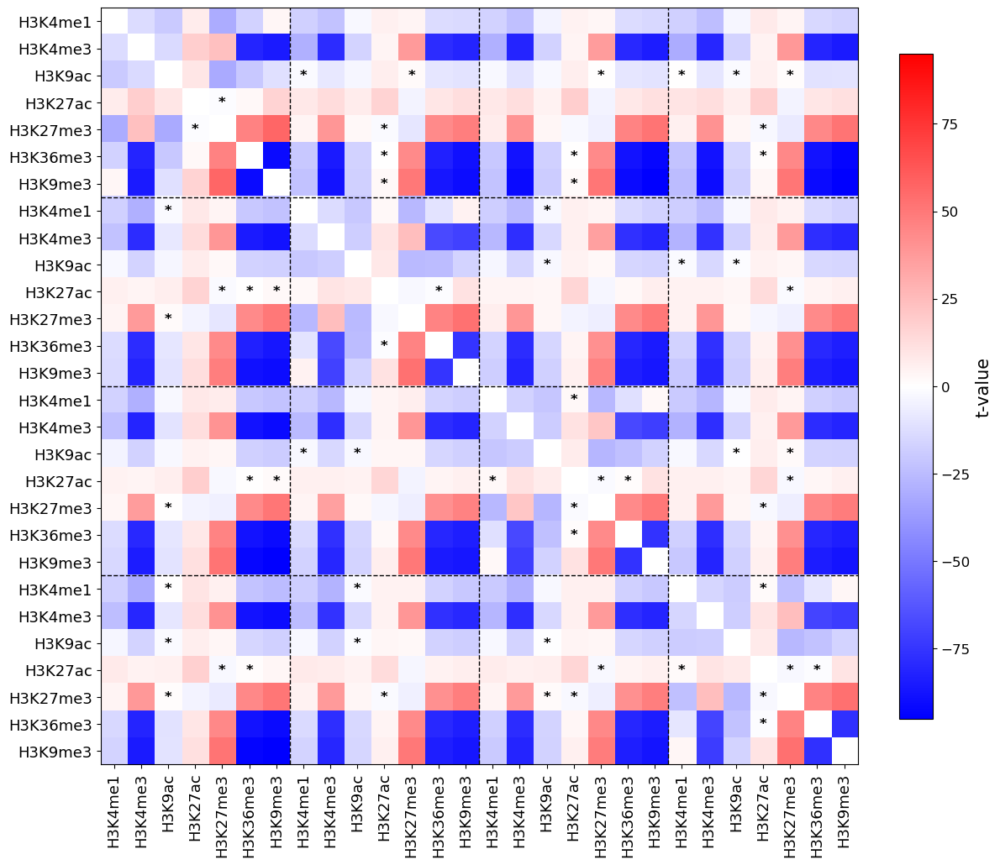

In [ ]:
# 1) Diagonal NaN
np.fill_diagonal(t_stats, np.nan)

# 2) Normalization
abs_max = np.nanmax(np.abs(t_stats))
norm = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)

# 3) Colormap
custom_cmap = LinearSegmentedColormap.from_list(
    "custom_red_white_blue", ["blue", "white", "red"]
)

# 4) 
modifiche_istone = ["H3K4me1", "H3K4me3", "H3K9ac",
                    "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]
n_mod = len(modifiche_istone)
n_geni = 28 // n_mod
tick_labels = modifiche_istone * n_geni  # 7 etichette ripetute 4 volte

# 5) Plot
fig, ax = plt.subplots(figsize=(12, 12))  # grande per leggere bene le label
im = ax.imshow(t_stats, cmap=custom_cmap, norm=norm)

cbar = plt.colorbar(im, ax=ax, fraction=0.04, shrink=0.8, pad=0.05)
cbar.set_label('t-value', fontsize=15)
cbar.ax.tick_params(labelsize=12)
ax.set_xticks(range(28))
ax.set_yticks(range(28))
ax.set_xticklabels(tick_labels, rotation=90, fontsize=13)
ax.set_yticklabels(tick_labels, rotation=0, fontsize=13)

for i in range(28):
    for j in range(28):
        if i != j and p_adj[i, j] >= 0.01:
            ax.text(j, i, '*', ha='center', va='center',
                    color='black', fontsize=12, fontweight='bold') # * put on > 0.01. modify here if you wish to change it

for k in range(1, n_geni):
    ax.axvline(x=n_mod * k - 0.5, color='black', linestyle='--', lw=1)
    ax.axhline(y=n_mod * k - 0.5, color='black', linestyle='--', lw=1)

plt.tight_layout()
plt.show()

### permutation test

Permutation p-value (mean|t|) = 0.000999


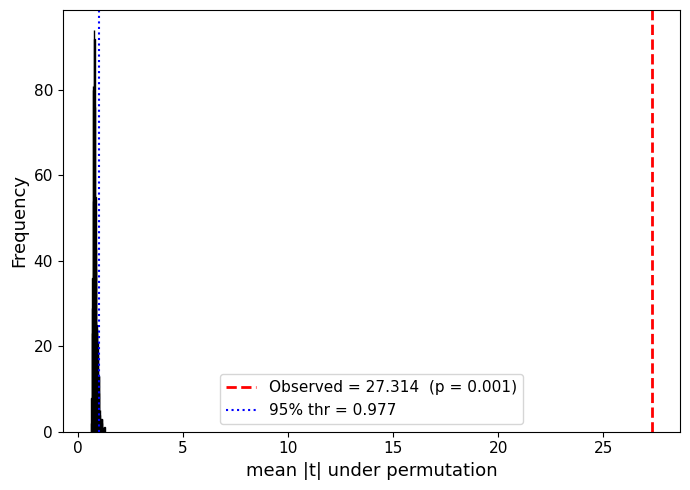

In [ ]:
N_PERM = 1000
rng = np.random.default_rng(42)

iu = np.triu_indices(28, k=1)

obs_mean = np.nanmean(np.abs(t_stats[iu]))

# null distribution
null_mean = np.empty(N_PERM)

for b in range(N_PERM):
    perm = rng.permutation(labels)
    gp0 = X[perm == 0]
    gp1 = X[perm == 1]

    t_vals = []
    for i, j in zip(*iu):
        vals0 = gp0[:, i, j]
        vals1 = gp1[:, i, j]
        tt, _ = ttest_ind(vals0, vals1, equal_var=False)
        t_vals.append(abs(tt))

    null_mean[b] = np.nanmean(t_vals)

# p-value 
p_val = (1 + np.sum(null_mean >= obs_mean)) / (N_PERM + 1)
print(f"Permutation p-value (mean|t|) = {p_val:.4g}")

#plot
plt.figure(figsize=(7,5))
plt.hist(null_mean, bins=40, color='lightgray', edgecolor='black')
plt.axvline(obs_mean, color='red', lw=2, ls='--',
            label=f'Observed = {obs_mean:.3f}  (p = {p_val:.2g})')
q95 = np.quantile(null_mean, 0.95)
plt.axvline(q95, color='blue', ls=':',
            label=f'95% thr = {q95:.3f}')
plt.xlabel('mean |t| under permutation', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
# ingrandire i tick
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
# ingrandire la legenda
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()

## Adjacency Matrix creation

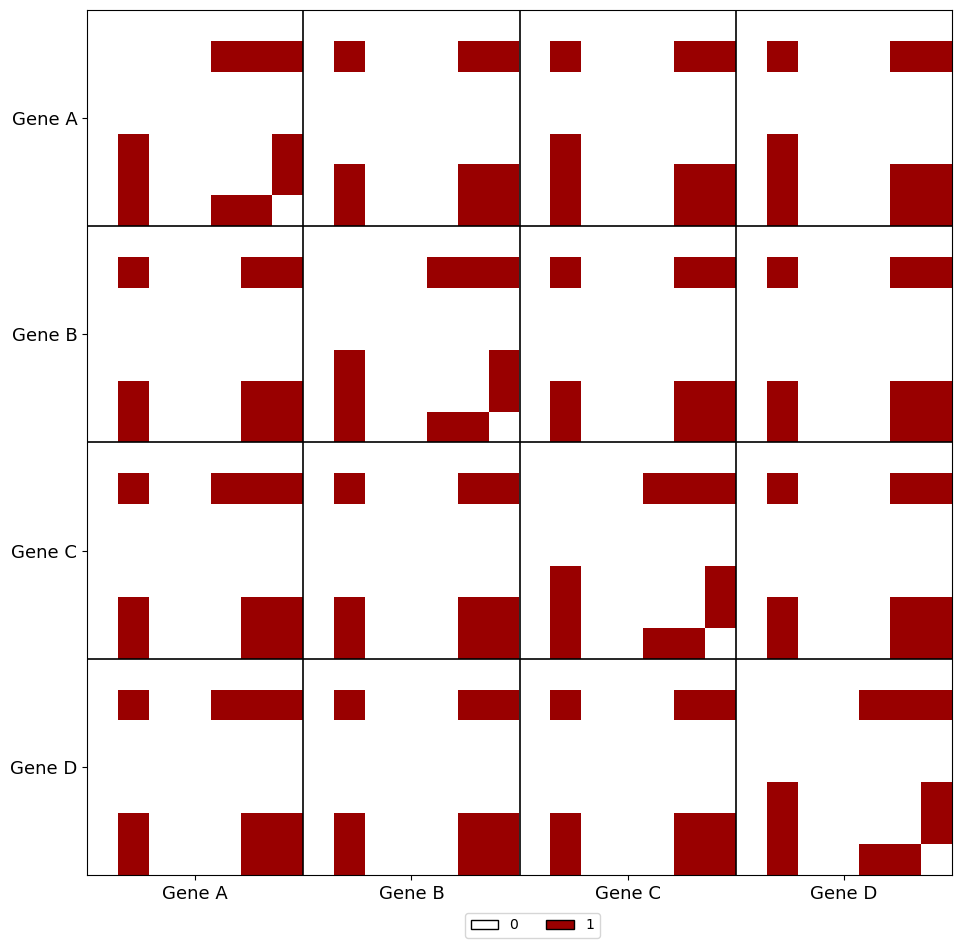

In [ ]:
# parameters
threshold = 40  # aboslute t-test
p_threshold = 0.01  # p-value  FDR

# === 1. Matrix  28x28  t-test ===
# Usa t_stats e p_adj 
adj_matrix_28 = ((np.abs(t_stats) > threshold) & (p_adj < p_threshold)).astype(int)

# Diagonal  0
np.fill_diagonal(adj_matrix_28, 0)

# === 2. Plot ===
fig, ax = plt.subplots(figsize=(10, 10))

cmap = LinearSegmentedColormap.from_list("smooth_red", ["#ffffff", "#ffcccc", "#990000"])
im = ax.imshow(adj_matrix_28, cmap=cmap)

n_nodes = 7
n_layers = 4
tick_pos = [n_nodes * i + n_nodes // 2 for i in range(n_layers)]
tick_labels = ["Gene A", "Gene B", "Gene C", "Gene D"]
ax.set_xticks(tick_pos)
ax.set_yticks(tick_pos)
ax.set_xticklabels(tick_labels, fontsize=13)
ax.set_yticklabels(tick_labels, fontsize=13)

ax.set_xticks(np.arange(n_layers * n_nodes), minor=True)
ax.set_yticks(np.arange(n_layers * n_nodes), minor=True)
ax.tick_params(which="minor", bottom=False, left=False)

for l in range(1, n_layers):
    ax.axhline(l * n_nodes - 0.5, color='black', linewidth=1.2)
    ax.axvline(l * n_nodes - 0.5, color='black', linewidth=1.2)

legend_elements = [
    mpatches.Patch(facecolor="#ffffff", edgecolor='black', label="0"),
    mpatches.Patch(facecolor="#990000", edgecolor='black', label="1")
]
fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=10, frameon=True, bbox_to_anchor=(0.55, 0.05))

plt.tight_layout()
plt.subplots_adjust(bottom=0.12) 
plt.show()

## GNN

### Setup for the GNN

In [ ]:
#df = pd.read_csv("geni_matrice.csv")
#righe_da_saltare = [877, 1976, 6978, 8439, 9751, 11061, 11542]
#df = df.drop(index=righe_da_saltare).reset_index(drop=True)
#df

#df = pd.read_csv("geni_matrice_E066.csv")
#df

#df = pd.read_csv("geni_matrice_E116.csv")
#df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione,matrice_correlazioni
0,ENSG00000000003,0.038,E116,0,chrX,99891803,99891804,-,4,NaN,NaN,7105,"27286,27018,1266","[[1.0, 0.27352259029270853, 0.0782571095303360..."
1,ENSG00000000005,0.000,E116,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"9370,4886,10345","[[0.9999999999999999, 0.08832596510152678, 0.0..."
2,ENSG00000000457,11.082,E116,1,chr1,169863037,169863038,-,1,chr1:170861787-170871823;chr1:170810906-170815...,1.6897;1.6651;1.5914;1.5681,57147,"92344,25896,8548","[[0.9999999999999999, 0.12472055671032883, 0.0..."
3,ENSG00000000460,13.743,E116,1,chr1,169764179,169764180,+,1,chr1:168550558-168560926;chr1:170861787-170871...,1.5144;1.5077;1.5048,55732,"286826,253714,2491","[[1.0, 0.19410943837598973, 0.1200008387496029..."
4,ENSG00000000938,98.303,E116,1,chr1,27953108,27953109,-,1,chr1:27744472-27751372;chr1:27724126-27728304;...,2.1425;2.1091;2.1017;2.0174;1.9352;1.8936;1.86...,2268,"3101,3687,10288","[[1.0, 0.38621019296561265, 0.1560829954657618..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11817,ENSG00000258818,0.908,E116,0,chr14,21152717,21152718,+,1,chr14:21131086-21137483;chr14:21089191-2109805...,3.7358;3.3108;3.2019;2.8459;2.8299;2.426;2.353...,6038,"283,92689,10954","[[1.0, 0.30679415352421174, 0.1892333253170229..."
11818,ENSG00000258839,0.329,E116,0,chr16,89985268,89985269,+,3,chr16:89748500-89753609;chr16:90050224-9006236...,3.0194;2.737;2.6932;2.3552;2.0931;1.9735;1.94;...,4157,"10381,84501,9311","[[1.0, 0.4639135783850369, 0.00110121584316817..."
11819,ENSG00000258890,21.644,E116,1,chr17,62503093,62503094,+,4,chr17:62633144-62637916;chr17:62625450-6263314...,2.8741;2.8195;2.5225;2.256;2.1322;2.1009;2.100...,90799,"11011,23360,57602","[[0.9999999999999998, 0.18347840270745974, 0.1..."
11820,ENSG00000258947,0.376,E116,0,chr16,89988331,89988332,+,3,chr16:89748500-89753609;chr16:90050224-9006236...,3.0194;2.737;2.6932;2.3552;2.0931;1.9735;1.94;...,10381,"4157,7280,79007","[[1.0, 0.45425135778352416, -0.004015835294866..."


In [ ]:
#info_data_completo = pd.read_csv('C:/Users/stefa/OneDrive/Desktop/geni_pulito_E003.csv')
#info_data_completo

#info_data_completo = pd.read_csv('C:/Users/stefa/OneDrive/Desktop/geni_pulito_E066.csv')
#info_data_completo

#info_data_completo = pd.read_csv('C:/Users/stefa/OneDrive/Desktop/geni_pulito_E116.csv')
#info_data_completo

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione
0,ENSG00000000003,0.038,E116,0,chrX,99891803,99891804,-,4,NaN,NaN,7105,"27286,27018,1266"
1,ENSG00000000005,0.000,E116,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"9370,4886,10345"
2,ENSG00000000419,79.197,E116,1,chr20,49575101,49575102,-,3,chr20:49408303-49420667;chr20:49930810-4993724...,3.189;2.209;2.0434;2.0214;1.848;1.763;1.7583;1...,8813,"8520,51639,57129"
3,ENSG00000000457,11.082,E116,1,chr1,169863037,169863038,-,1,chr1:170861787-170871823;chr1:170810906-170815...,1.6897;1.6651;1.5914;1.5681,57147,"92344,25896,8548"
4,ENSG00000000460,13.743,E116,1,chr1,169764179,169764180,+,1,chr1:168550558-168560926;chr1:170861787-170871...,1.5144;1.5077;1.5048,55732,"286826,253714,2491"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14286,ENSG00000258920,0.907,E116,0,chr14,89883696,89883697,+,1,chr14:90082294-90092211,2.3681,400236,"79178,101926888,100507437"
14287,ENSG00000258947,0.376,E116,0,chr16,89988331,89988332,+,3,chr16:89748500-89753609;chr16:90050224-9006236...,3.0194;2.737;2.6932;2.3552;2.0931;1.9735;1.94;...,10381,"4157,7280,79007"
14288,ENSG00000259120,1.560,E116,0,chr17,73642329,73642330,+,4,chr17:73667136-73672961;chr17:73698918-7370728...,4.297;3.3018;3.0478;3.0405;3.0124;2.8662;2.793...,100130933,"53841,745,10110"
14289,ENSG00000259207,8.684,E116,1,chr17,45331191,45331192,+,4,chr17:45735626-45738934;chr17:44810688-4481381...,1.6418;1.5638;1.5125,3690,"124989,5473,107984360"


In [ ]:
#features_df = pd.read_csv("features_epigenetiche_per_gene.csv")
#features_df

#features_df = pd.read_csv("features_epigenetiche_per_gene_E066.csv")
#features_df

#features_df = pd.read_csv("features_epigenetiche_per_gene_E116.csv")
#features_df
#features_df["node"] = features_df["node"].astype(str).str.replace("_aggregate", "", regex=False)
#features_df

,node,H3K4me1_f0,H3K4me1_f1,H3K4me1_f2,H3K4me1_f3,H3K4me1_f4,H3K4me1_f5,H3K4me1_f6,H3K4me1_f7,H3K4me1_f8,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,5495,0.015042,-0.105528,0.104516,0.036577,0.014459,0.102694,0.169369,-0.008814,0.043997,...,-0.036763,0.039764,0.001947,0.106761,0.023855,-0.016578,-0.038060,0.130308,0.185164,-0.175867
1,6331,-0.008547,-0.044791,0.065512,-0.017840,-0.008227,0.010416,0.103204,-0.007540,-0.001421,...,-0.058254,-0.005996,-0.023929,-0.032204,0.006352,0.014998,-0.047897,0.121553,-0.001429,-0.104830
2,92070,0.006963,0.005706,0.081760,0.135557,-0.028900,0.050882,0.224213,0.000264,-0.077824,...,-0.211749,0.068642,0.032695,-0.118323,0.198408,0.093461,-0.102178,0.307458,0.241173,0.145229
3,10975,-0.022843,-0.102892,0.085359,0.037361,-0.031824,-0.046194,0.200885,-0.057743,-0.039348,...,0.092508,-0.051698,-0.135386,0.209824,0.187047,-0.187795,-0.082838,-0.026347,0.012678,-0.394940
4,2287,-0.061861,-0.052944,0.071379,0.027083,-0.046482,0.024519,0.190527,0.064273,-0.024587,...,-0.167534,0.042823,0.027983,-0.074247,0.131274,0.055320,-0.054348,0.242103,0.183640,0.027993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15743,55906,-0.020751,-0.046727,0.048865,-0.033664,-0.014026,0.030559,0.077082,0.011431,0.005980,...,-0.072218,0.010094,-0.009628,-0.039455,0.016227,0.028150,-0.060898,0.116788,0.007802,-0.071964
15744,54841,-0.009033,-0.122653,0.186781,0.030236,0.008555,0.036347,0.150116,-0.042194,0.024379,...,-0.005635,0.053302,0.002259,0.127870,0.024719,-0.032484,-0.045967,0.070457,0.149461,-0.219097
15745,51816,-0.190054,-0.118627,0.286424,-0.017736,-0.114198,-0.095869,0.275877,-0.117725,-0.151243,...,-0.037743,0.039178,0.033844,0.072400,-0.029143,-0.008083,-0.051272,0.110556,0.092154,-0.176462
15746,3640,-0.024655,-0.040733,0.064651,-0.024052,-0.003610,0.022139,0.066822,0.024182,0.037727,...,-0.050500,-0.004549,-0.011527,-0.025317,-0.003752,0.012307,-0.057909,0.112888,-0.008192,-0.101788


In [ ]:

node_to_index = {}
histone_marks = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]

for idx, row in features_df.iterrows():
    gene_id = row['node']  # Prendi l'ID del gene
    # Itera su ogni mark
    for mark in histone_marks:
        node_name = f"{gene_id}_{mark}"  # Nodo senza f{i}
        node_to_index[node_name] = idx

test_gene = '27286'  # Sostituisci con un gene che vuoi testare
test_mark = 'H3K4me1'  # Testiamo con un mark istone
test_node = f"{test_gene}_{test_mark}"  # Nodo senza f{i}

if test_node in node_to_index:
    index = node_to_index[test_node]
    print(f"Indice del nodo {test_node}: {index}")
    
    # Prendi tutte le caratteristiche per il nodo (f0 a f99 per il mark specificato)
    start_col = features_df.columns.get_loc(f"{test_mark}_f0")  # Trova la colonna f0 del mark
    end_col = features_df.columns.get_loc(f"{test_mark}_f99") + 1  # Trova la colonna f99 del mark (inclusiva)
    
    # Estrai le caratteristiche per il nodo
    node_features = features_df.iloc[index, start_col:end_col].values  # Ottieni le caratteristiche numeriche
    print(f"Feature per il nodo {test_node}: {node_features}")
    
    # Debug: Verifica la lunghezza delle caratteristiche
    print(f"Lunghezza delle caratteristiche per il nodo {test_node}: {len(node_features)}")
else:
    print(f"Il nodo {test_node} non esiste nella mappa!")


Indice del nodo 27286_H3K4me1: 5273
Feature per il nodo 27286_H3K4me1: [-0.0424966141581535 -0.0733852088451385 0.1597399711608886
 -0.0595768019556999 0.0034260898828506 0.0444234460592269
 0.02488948777318 -0.0144472979009151 0.0106359189376235
 -0.0399553775787353 -0.0282319206744432 -0.0599419362843036
 0.0795234143733978 0.010044440627098 0.0704179480671882
 -0.0809787288308143 -0.0106887146830558 -0.0756665766239166
 -0.0123607143759727 0.1518984735012054 0.1346493363380432
 -0.1056325435638427 0.0899349972605705 -0.0149738937616348
 -0.0075830863788723 -0.0627777278423309 0.0268273763358593
 0.0538185611367225 -0.0665605291724205 0.0633975118398666
 0.0358701720833778 -0.0783748030662536 -0.0625653862953186
 0.0186145305633544 -0.1915726065635681 0.0702902600169181
 -0.0450021885335445 -0.0582257285714149 -0.0940960794687271
 -0.0752503275871276 0.0878564417362213 -0.0413731858134269
 -0.0931598395109176 0.1004688143730163 0.1418228298425674
 -0.1092605590820312 0.01525832340121

In [ ]:
# === PARAMETERS ===
histone_marks = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]
n_genes = 4
n_marks = 7
n_nodes = n_genes * n_marks  # 28 nodes
t_threshold = 40
p_threshold = 0.01  

# === 1. Creazione matrice di adiacenza 28x28 basata su t_stats ===
# t_stats e p_adj_summary 
adj_matrix = ((np.abs(t_stats) > t_threshold) & (p_adj < p_threshold)).astype(int)
np.fill_diagonal(adj_matrix, 0)  

# === 2. mapping nodes ===
node_to_index = {}
for idx, row in features_df.iterrows():
    gene_id = str(row['node'])
    for mark in histone_marks:
        node_name = f"{gene_id}_{mark}"
        node_to_index[node_name] = idx

mark_to_columns = {mark: [f"{mark}_f{i}" for i in range(100)] for mark in histone_marks}

# === 3. graph construction ===
graph_list = []
all_node_feats = []
skipped = 0

for idx, row in tqdm(df.iterrows(), total=len(df), desc="Costruzione grafi"):
    primary_gene = str(row["entrez_id"])
    if pd.isna(row["co-espressione"]):
        skipped += 1
        continue

    co_genes = [g.strip() for g in row["co-espressione"].split(",")[:3]]
    genes_in_group = [primary_gene] + co_genes

    node_names = [f"{gene}_{mark}" for gene in genes_in_group for mark in histone_marks]

    node_feats = []
    valid = True

    for node in node_names:
        if node not in node_to_index:
            print(f"⚠️ Nodo mancante: {node}")
            valid = False
            break

        gene_id, mark = node.split("_")
        idx_in_df = node_to_index[node]

        start_col = features_df.columns.get_loc(f"{mark}_f0")
        end_col = features_df.columns.get_loc(f"{mark}_f99") + 1
        feats = features_df.iloc[idx_in_df, start_col:end_col].values.astype(np.float32)
        node_feats.append(feats)

    if not valid or len(node_feats) != n_nodes:
        skipped += 1
        continue

    all_node_feats.extend(node_feats)

    # correlation matrix (edge weights)
    try:
        corr_matrix = np.array(ast.literal_eval(row["matrice_correlazioni"]))
        if corr_matrix.shape != (n_nodes, n_nodes):
            skipped += 1
            continue
    except:
        skipped += 1
        continue

    edge_list = []
    edge_weights = []

    for i in range(n_nodes):
        for j in range(i + 1, n_nodes):
            if adj_matrix[i, j] == 1:  # connection
                weight = corr_matrix[i, j]  # weigth on correlation
                edge_list.append([i, j])
                edge_list.append([j, i])  # simmetry
                edge_weights.append(weight)
                edge_weights.append(weight)

    if len(edge_list) == 0:
        skipped += 1
        continue

    edge_index = torch.tensor(edge_list, dtype=torch.long).T
    edge_attr = torch.tensor(edge_weights, dtype=torch.float).unsqueeze(1)
    label = torch.tensor([int(row["label"])], dtype=torch.long)

    graph_list.append((node_feats, edge_index, edge_attr, label))

# === 4. Global Standardization===
scaler = StandardScaler()
all_node_feats = np.vstack(all_node_feats)
all_node_feats = scaler.fit_transform(all_node_feats)

# === 5. Data objects PyG ===
for i, (node_feats, edge_index, edge_attr, label) in enumerate(graph_list):
    start_idx = i * n_nodes
    end_idx = (i + 1) * n_nodes
    node_feats_tensor = torch.tensor(all_node_feats[start_idx:end_idx], dtype=torch.float32)

    data = Data(x=node_feats_tensor, edge_index=edge_index, edge_attr=edge_attr, y=label)
    graph_list[i] = data

print(f"✅ Graphs built: {len(graph_list)}")
print(f"⛔ Graphs skipped: {skipped}")

Costruzione grafi: 100%|██████████| 11822/11822 [05:04<00:00, 38.83it/s]


✅ Grafi costruiti: 11815
⛔ Grafi saltati: 7


In [ ]:
# CHECK
if torch.allclose(graph_list[0].x, graph_list[1].x):
    print("ATTENZIONE: Le feature dei nodi nei primi due grafi sono identiche!")
else:
    print("OK: Le feature dei nodi sono diverse tra i primi due grafi.")

if torch.allclose(graph_list[0].edge_attr, graph_list[1].edge_attr):
    print("ATTENZIONE: I pesi degli archi sono identici nei primi due grafi!")
else:
    print("OK: I pesi degli archi sono diversi nei primi due grafi.")

for i, graph in enumerate(graph_list[:50]):  # primi 3 grafi
    print(f"Grafo {i}: nodi={graph.num_nodes}, archi={graph.edge_index.size(1)}, media feature={graph.x.mean():.4f}, media peso archi={graph.edge_attr.mean():.4f}")

OK: Le feature dei nodi sono diverse tra i primi due grafi.
OK: I pesi degli archi sono diversi nei primi due grafi.
Grafo 0: nodi=28, archi=152, media feature=0.0120, media peso archi=0.0398
Grafo 1: nodi=28, archi=152, media feature=0.0114, media peso archi=0.0096
Grafo 2: nodi=28, archi=152, media feature=0.0034, media peso archi=0.5043
Grafo 3: nodi=28, archi=152, media feature=0.0276, media peso archi=0.5047
Grafo 4: nodi=28, archi=152, media feature=-0.0304, media peso archi=0.0980
Grafo 5: nodi=28, archi=152, media feature=0.0254, media peso archi=0.0092
Grafo 6: nodi=28, archi=152, media feature=0.0102, media peso archi=0.3369
Grafo 7: nodi=28, archi=152, media feature=-0.0061, media peso archi=0.1036
Grafo 8: nodi=28, archi=152, media feature=0.0127, media peso archi=0.1768
Grafo 9: nodi=28, archi=152, media feature=0.0082, media peso archi=0.1566
Grafo 10: nodi=28, archi=152, media feature=-0.0144, media peso archi=0.0595
Grafo 11: nodi=28, archi=152, media feature=0.0134, me

In [ ]:
# CHECK
g = graph_list[0]

print("=== Informazioni sul primo grafo ===")
print(f"Numero nodi: {g.num_nodes}")
print(f"Numero archi: {g.num_edges}")
print(f"Shape delle feature: {g.x.shape}")
print(f"Shape edge_index: {g.edge_index.shape}")
print(f"Shape edge_attr: {g.edge_attr.shape}")
print(f"Label: {g.y.item()}")

print("\n--- Prime 5 feature del primo nodo ---")
print(g.x[0][:5])

print("\n--- Feature dei primi 5 nodi (prime 5 dimensioni) ---")
for i in range(5):
    print(f"Nodo {i}: {g.x[i][:5].tolist()}")

print("\n--- Primi 5 archi con pesi ---")
for i in range(min(5, g.edge_index.shape[1])):
    src = g.edge_index[0, i].item()
    dst = g.edge_index[1, i].item()
    weight = g.edge_attr[i].item()
    print(f"{src} → {dst}, peso: {weight:.3f}")

=== Informazioni sul primo grafo ===
Numero nodi: 28
Numero archi: 152
Shape delle feature: torch.Size([28, 100])
Shape edge_index: torch.Size([2, 152])
Shape edge_attr: torch.Size([152, 1])
Label: 0

--- Prime 5 feature del primo nodo ---
tensor([ 0.2657,  0.5135, -0.7043, -0.1490,  0.5395])

--- Feature dei primi 5 nodi (prime 5 dimensioni) ---
Nodo 0: [0.26565486192703247, 0.5135323405265808, -0.7043172717094421, -0.14898918569087982, 0.5394829511642456]
Nodo 1: [0.08075577765703201, 0.4177660346031189, -0.5952278971672058, -0.33901679515838623, 0.35539036989212036]
Nodo 2: [-0.004380826372653246, -0.27217504382133484, 0.05130893737077713, -0.06450717896223068, 0.2688834071159363]
Nodo 3: [-0.22512832283973694, -0.508094847202301, -0.025582166388630867, -0.3358113169670105, -0.295238196849823]
Nodo 4: [0.37596264481544495, 0.28719329833984375, -0.5994519591331482, -0.6422891616821289, 0.5533995628356934]

--- Primi 5 archi con pesi ---
1 → 4, peso: 0.049
4 → 1, peso: 0.049
1 → 5, pe

In [ ]:
# PLOT
def plot_graph_layered_final(data, gene_names=None):

    G = to_networkx(data, edge_attrs=["edge_attr"], to_undirected=True)
    
    num_nodes = data.num_nodes
    marks_per_gene = 7
    num_genes = num_nodes // marks_per_gene

    pos = {}
    for i in range(num_nodes):
        gene_idx = i // marks_per_gene
        mark_idx = i % marks_per_gene
        pos[i] = (gene_idx, -mark_idx)

    cmap = cm.get_cmap('tab10', marks_per_gene)
    node_colors = [cmap((i % marks_per_gene) / marks_per_gene) for i in range(num_nodes)]

    plt.figure(figsize=(12, 6))
    ax = plt.gca()

    nx.draw_networkx_nodes(G, pos,
                           node_size=400,
                           node_color=node_colors,
                           edgecolors='black',
                           linewidths=1.2,
                           ax=ax)

    nx.draw_networkx_edges(G, pos, alpha=0.6, ax=ax)

    edge_labels = {}
    for u, v, d in G.edges(data=True):
        weight = float(d['edge_attr'][0])
        edge_labels[(u, v)] = f"{weight:.2f}"
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=6, ax=ax)

    if gene_names is None:
        gene_names = [f"Gene {i+1}" for i in range(num_genes)]
    for gene_idx, gene_name in enumerate(gene_names):
        plt.text(gene_idx, 0.5, gene_name, ha='center', fontsize=10, fontweight='bold')

    mark_labels = ["H3K4me1","H3K4me3","H3K9ac","H3K27ac","H3K27me3","H3K36me3","H3K9me3"]
    legend_elements = [Patch(facecolor=cmap(i/marks_per_gene), edgecolor='black', label=lbl)
                       for i, lbl in enumerate(mark_labels)]
    plt.legend(handles=legend_elements, title="Histone Marks", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.axis('off')
    plt.tight_layout()
    plt.show()


C:\Users\stefa\AppData\Local\Temp\ipykernel_45696\1911261262.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', marks_per_gene)


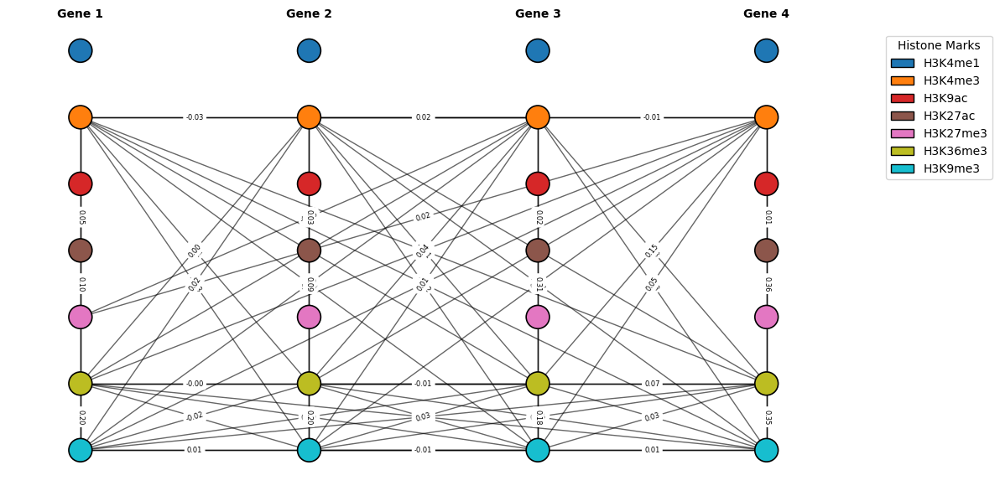

In [ ]:
# gene_names 
gene_names = ["Gene 1", "Gene 2", "Gene 3", "Gene 4"]

plot_graph_layered_final(graph_list[0], gene_names=gene_names)

In [ ]:
#CHECK
# Supponiamo di avere un grafo casuale selezionato dalla lista graph_list
random_graph = random.choice(graph_list)

# Seleziona due nodi casuali (ad esempio, due indici casuali)
node_1_index = random.randint(0, random_graph.x.size(0) - 1)
node_2_index = random.randint(0, random_graph.x.size(0) - 1)

# Estrai le caratteristiche dei nodi
node_1_features = random_graph.x[node_1_index].numpy()  # Caratteristiche del nodo 1
node_2_features = random_graph.x[node_2_index].numpy()  # Caratteristiche del nodo 2

# Verifica se le caratteristiche sono uniche per ogni nodo
if np.array_equal(node_1_features, node_2_features):
    print(f"I nodi {node_1_index} e {node_2_index} hanno le stesse caratteristiche.")
else:
    print(f"I nodi {node_1_index} e {node_2_index} hanno caratteristiche diverse.")

# Aggiungi un controllo per stampare tutte le caratteristiche per il grafo
print("Controllo caratteristiche dei nodi nel grafo selezionato:")
for i in range(random_graph.x.size(0)):  # Ciclo su tutti i nodi
    node_features = random_graph.x[i].numpy()
    print(f"Nodo {i} - Caratteristiche: {node_features}")
    print(f"Numero di caratteristiche per il nodo {i}: {len(node_features)}")


I nodi 11 e 10 hanno caratteristiche diverse.
Controllo caratteristiche dei nodi nel grafo selezionato:
Nodo 0 - Caratteristiche: [ 0.537909    1.4593282  -0.07064256 -0.2057306   0.29772034 -0.41844714
 -0.68262225 -0.09573106  0.6345243   0.60915136 -0.922368   -0.280116
 -0.61638254 -0.7962261  -0.27124462  0.71960187 -0.08099508  0.6231321
 -1.456897   -0.3745818  -0.42249605 -0.30151364 -1.2967923  -0.03777754
  0.8483266  -0.89772457 -0.53521436 -1.5126932   0.6252466  -1.3686813
  0.5305715  -0.25679886 -0.53538114 -0.27949196  0.64091     0.7209573
  0.9383292   1.2504535   0.10727037 -0.45973274 -0.02008973 -0.76379025
  1.2444532  -0.3261625  -1.0217407   0.11225341 -0.7727808  -0.51867414
  0.2775282   0.6526173  -0.01468134  0.35290077  0.12332305  0.20576356
 -0.20836808 -1.0415936   0.9226019   0.36799645 -0.1542177   1.408101
 -0.99769455  1.2255064  -0.18471491  0.80522513 -1.5649585   0.6696952
 -0.04340651  0.01193655  0.7210443   0.9148799   0.24295843  0.65914005
 -

## Multilayer GNN

In [ ]:
# ==== Utils ====
def safe_div(n, d):
    return float(n) / float(d) if d != 0 else 0.0

def drop_edges(edge_index, edge_attr, p=0.1, training=True):
    if (not training) or (p <= 0):
        return edge_index, edge_attr
    E = edge_index.size(1)
    keep = torch.rand(E, device=edge_index.device) > p
    edge_index = edge_index[:, keep]
    if edge_attr is not None:
        edge_attr = edge_attr[keep]
    return edge_index, edge_attr

def collect_logits_and_labels(model, device, loader):
    model.eval()
    ys, logits = [], []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out = model(data.x, data.edge_index, data.edge_attr, data.batch).view(-1)
            out = torch.nan_to_num(out, nan=0.0, posinf=1e6, neginf=-1e6)
            logits.append(out.detach().cpu())
            ys.append(data.y.view(-1).detach().cpu().float())

    if not ys:
        return np.array([]), np.array([])

    y_true = torch.cat(ys).numpy()
    logit  = torch.cat(logits).numpy()

    m = np.isfinite(y_true) & np.isfinite(logit)
    return y_true[m], logit[m]

def evaluate_auc(model, device, loader):
    y_true, logit = collect_logits_and_labels(model, device, loader)
    if y_true.size == 0 or np.unique(y_true).size < 2:
        return 0.5
    logit = np.clip(logit, -60, 60)
    prob = 1.0 / (1.0 + np.exp(-logit))
    m = np.isfinite(prob) & np.isfinite(y_true)
    y_true, prob = y_true[m], prob[m]
    if y_true.size == 0 or np.unique(y_true).size < 2:
        return 0.5
    return float(roc_auc_score(y_true, prob))

def best_threshold(y_true, prob, metric='f1'):
    ts = np.linspace(0.0, 1.0, 2001)
    best, t_best = -1.0, 0.5
    for t in ts:
        y_hat = (prob >= t).astype(int)
        if metric == 'f1':
            s = f1_score(y_true, y_hat, zero_division=0)
        elif metric == 'youden':
            TP = ((y_hat==1)&(y_true==1)).sum()
            FP = ((y_hat==1)&(y_true==0)).sum()
            TN = ((y_hat==0)&(y_true==0)).sum()
            FN = ((y_hat==0)&(y_true==1)).sum()
            tpr = safe_div(TP, TP+FN); fpr = safe_div(FP, FP+TN)
            s = tpr - fpr
        else:
            s = (y_hat == y_true).mean()
        if s > best:
            best, t_best = s, t
    return float(t_best), float(best)

# ==== Standardizzazione feature dei nodi per fold ====
@torch.no_grad()
def compute_feature_stats(graphs):
    Xs = []
    for g in graphs:
        if hasattr(g, 'x') and g.x is not None:
            Xs.append(g.x.float().cpu())
    X = torch.cat(Xs, dim=0) if len(Xs) else torch.zeros(1, 1)
    mean = X.mean(dim=0)
    std  = X.std(dim=0).clamp_min(1e-6)
    return mean, std

@torch.no_grad()
def apply_standardization(graphs, mean, std):
    for g in graphs:
        if hasattr(g, 'x') and g.x is not None:
            g.x = ((g.x.float() - mean) / std).to(g.x.dtype)

# ==== Modello: GINE + JK, BN, Residual, Mean+Max pooling ====
class GINE_JK_Head(torch.nn.Module):
    def __init__(self, in_ch, hidden, num_layers, drop_p=0.3, dropedge_p=0.0, edge_dim=1):
        super().__init__()
        self.dropedge_p = dropedge_p
        self.act = GELU()
        self.dropout = Dropout(drop_p)

        self.input = Linear(in_ch, hidden)

        self.convs = torch.nn.ModuleList()
        self.bns   = torch.nn.ModuleList()
        for _ in range(num_layers):
            mlp = Sequential(
                Linear(hidden, hidden),
                GELU(),
                Linear(hidden, hidden)
            )
            # usa edge_attr scalare con proiezione (edge_dim=1)
            self.convs.append(GINEConv(mlp, train_eps=True, edge_dim=edge_dim))
            self.bns.append(BatchNorm1d(hidden))

        self.jk = JumpingKnowledge(mode='cat')
        jk_out_dim = hidden * num_layers

        # head su pooling mean+max concatenati
        self.head = Sequential(
            Linear(jk_out_dim * 2, jk_out_dim),
            GELU(),
            Dropout(drop_p),
            Linear(jk_out_dim, jk_out_dim // 2),
            GELU(),
            Dropout(drop_p),
            Linear(jk_out_dim // 2, 1)
        )

    def forward(self, x, edge_index, edge_attr, batch):
        if self.training and self.dropedge_p > 0.0:
            edge_index, edge_attr = drop_edges(edge_index, edge_attr, p=self.dropedge_p, training=True)

        # sanitize edge_attr -> [B,1]
        if edge_attr is not None:
            ew = torch.nan_to_num(edge_attr, nan=1.0, posinf=1.0, neginf=0.0).view(-1, 1)
        else:
            # se mancano, usa 1.0
            ew = torch.ones(edge_index.size(1), 1, device=edge_index.device)

        x = self.act(self.input(x))
        xs = []
        for conv, bn in zip(self.convs, self.bns):
            h = conv(x, edge_index, ew)   # GINEConv usa edge_attr come terzo argomento
            h = bn(h)
            h = self.act(h)
            h = self.dropout(h)
            x = x + h                      # residual
            xs.append(x)

        node_repr = self.jk(xs)            # [N, hidden*num_layers]
        g_mean = global_mean_pool(node_repr, batch)
        g_max  = global_max_pool(node_repr, batch)
        g = torch.cat([g_mean, g_max], dim=1)
        return self.head(g)

# ==== Train step ====
def train_one_epoch(model, device, train_loader, optimizer, criterion, clip_grad=None):
    model.train()
    total = 0.0
    n_batches = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad(set_to_none=True)

        out = model(data.x, data.edge_index, data.edge_attr, data.batch).view(-1)
        out = torch.nan_to_num(out, nan=0.0, posinf=1e6, neginf=-1e6)

        target = data.y.view(-1).float()
        target = torch.nan_to_num(target, nan=0.0, posinf=1.0, neginf=0.0)

        loss = criterion(out, target)
        if torch.isnan(loss) or torch.isinf(loss):
            continue

        loss.backward()
        if clip_grad is not None:
            torch.nn.utils.clip_grad_norm_(model.parameters(), clip_grad)
        optimizer.step()

        total += float(loss.item())
        n_batches += 1
    return total / max(1, n_batches)

# ==== Preparazione fold split ====
# Assumiamo che 'graph_list' e 'df' siano già presenti nel namespace.
for i, g in enumerate(graph_list):
    g.split = int(df.iloc[i]['split'])  # 1..num_folds

in_channels = graph_list[0].x.size(-1)

# ==== Cross-validation ====
fold_reports = []
for fold in range(1, num_folds + 1):
    print(f"\n===== Fold {fold}/{num_folds} =====")

    test_graphs  = [deepcopy(g) for g in graph_list if g.split == fold]
    pool_graphs  = [deepcopy(g) for g in graph_list if g.split != fold]

    # ---- Validation interna stratificata ----
    y_pool = np.array([int(g.y.item()) for g in pool_graphs])
    idx_pos = np.where(y_pool == 1)[0].tolist()
    idx_neg = np.where(y_pool == 0)[0].tolist()
    rng = np.random.RandomState(42 + fold)
    rng.shuffle(idx_pos); rng.shuffle(idx_neg)

    n_val_pos = max(1, int(len(idx_pos) * val_frac))
    n_val_neg = max(1, int(len(idx_neg) * val_frac))

    val_idx = set(idx_pos[:n_val_pos] + idx_neg[:n_val_neg])
    train_graphs = [pool_graphs[i] for i in range(len(pool_graphs)) if i not in val_idx]
    val_graphs   = [pool_graphs[i] for i in range(len(pool_graphs)) if i in val_idx]

    print(f"Train={len(train_graphs)}  Val={len(val_graphs)}  Test={len(test_graphs)}")

    # ---- Standardizza le node features (fit su train, apply a val/test) ----
    mean_x, std_x = compute_feature_stats(train_graphs)
    apply_standardization(train_graphs, mean_x, std_x)
    apply_standardization(val_graphs,   mean_x, std_x)
    apply_standardization(test_graphs,  mean_x, std_x)

    # ---- DataLoader ===
    train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=True)
    val_loader   = DataLoader(val_graphs,   batch_size=batch_size, shuffle=False)
    test_loader  = DataLoader(test_graphs,  batch_size=batch_size, shuffle=False)

    # ---- BCE con pos_weight ----
    y_train = torch.tensor([int(g.y.item()) for g in train_graphs], dtype=torch.float32)
    pos = float((y_train == 1).sum().item())
    neg = float((y_train == 0).sum().item())
    pos_weight = torch.tensor(neg / max(1.0, pos), device=device)

    model = GINE_JK_Head(
        in_ch=in_channels, hidden=hidden_channels, num_layers=num_layers,
        drop_p=dropout_p, dropedge_p=dropedge_p, edge_dim=1
    ).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = torch.nn.BCEWithLogitsLoss(pos_weight=pos_weight)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', factor=0.5, patience=10
    )

    # --- Early stopping su F1 valida ---
    best_score = -1.0
    best_state = None
    epochs_no_improve = 0

    for epoch in range(1, max_epochs + 1):
        loss = train_one_epoch(model, device, train_loader, optimizer, criterion, clip_grad=clip_grad_norm)

        # ---- Val metrics ----
        y_val, logit_val = collect_logits_and_labels(model, device, val_loader)
        if y_val.size:
            prob_val = 1.0 / (1.0 + np.exp(-np.clip(logit_val, -60, 60)))
            t_val, f1_val = best_threshold(y_val, prob_val, metric='f1')
            # puoi tracciare anche AUC valida:
            try:
                auc_val = roc_auc_score(y_val, prob_val)
            except ValueError:
                auc_val = float('nan')
            metric_for_es = f1_val
        else:
            t_val, f1_val, auc_val = 0.5, 0.0, float('nan')
            metric_for_es = 0.0

        scheduler.step(metric_for_es)

        print(f"Epoch {epoch:03d} | Loss={loss:.4f} | F1_val={f1_val:.4f} | AUC_val={auc_val if not np.isnan(auc_val) else 'N/A'} | t_val={t_val:.3f}")

        if metric_for_es > best_score + 1e-6:
            best_score = metric_for_es
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= early_patience:
                print(f"Early stopping at epoch {epoch} (best F1_val={best_score:.4f})")
                break

    # Carica i pesi migliori
    if best_state is not None:
        model.load_state_dict({k: v.to(device) for k, v in best_state.items()})

    # --- Threshold dalla validation (ottimizza F1) ---
    y_val, logit_val = collect_logits_and_labels(model, device, val_loader)
    prob_val = 1.0 / (1.0 + np.exp(-np.clip(logit_val, -60, 60))) if y_val.size else np.array([])
    t_star, _ = best_threshold(y_val, prob_val, metric='f1') if y_val.size else (0.5, 0.0)

    # --- Metriche su test @ t* ---
    y_test, logit_test = collect_logits_and_labels(model, device, test_loader)
    prob_test = 1.0 / (1.0 + np.exp(-np.clip(logit_test, -60, 60))) if y_test.size else np.array([])

    if y_test.size:
        y_hat = (prob_test >= t_star).astype(int)
        TP = int(((y_hat==1)&(y_test==1)).sum())
        FP = int(((y_hat==1)&(y_test==0)).sum())
        TN = int(((y_hat==0)&(y_test==0)).sum())
        FN = int(((y_hat==0)&(y_test==1)).sum())
        precision = safe_div(TP, TP+FP)
        recall    = safe_div(TP, TP+FN)
        f1        = safe_div(2*precision*recall, precision+recall)
        acc       = safe_div(TP+TN, TP+FP+TN+FN)
        try:
            auc = roc_auc_score(y_test, prob_test)
        except ValueError:
            auc = None
    else:
        precision = recall = f1 = acc = 0.0
        auc = None

    print(f"\n===== Fold {fold} results (t*={t_star:.3f}) =====")
    print(f"Test Acc={acc:.10f} | Prec={precision:.10f} | Rec={recall:.10f} | F1={f1:.10f} | AUC={auc if auc is not None else 'N/A'}")

    fold_reports.append({
        "acc": acc, "prec": precision, "rec": recall, "f1": f1,
        "auc": (auc if auc is not None else float('nan')),
        "t_star": t_star
    })

# ==== Report finale ====
def agg(key):
    vals = np.array([r[key] for r in fold_reports], dtype=float)
    if key == "auc":
        vals = vals[~np.isnan(vals)]
    return float(np.mean(vals)) if vals.size else float('nan'), float(np.std(vals)) if vals.size else float('nan')

m_acc, s_acc = agg("acc")
m_pre, s_pre = agg("prec")
m_rec, s_rec = agg("rec")
m_f1,  s_f1  = agg("f1")
m_auc, s_auc = agg("auc") if any(not np.isnan(r["auc"]) for r in fold_reports) else (float('nan'), float('nan'))
m_t,   s_t   = agg("t_star")

print("\n===== Averages over folds (Test @ t* from val) =====")
print(f"Acc: {m_acc:.10f} ± {s_acc:.4f}")
print(f"Prec:{m_pre:.10f} ± {s_pre:.4f}")
print(f"Rec: {m_rec:.10f} ± {s_rec:.4f}")
print(f"F1:  {m_f1:.10f} ± {s_f1:.4f}")
print(f"AUC: {m_auc:.10f} ± {s_auc:.4f}" if not np.isnan(m_auc) else "AUC: N/A")
print(f"t*:  {m_t:.3f} ± {s_t:.3f}")


===== Fold 1/4 =====
Train=7335  Val=1294  Test=3186
Epoch 001 | Loss=0.3168 | F1_val=0.9022 | AUC_val=0.9305136639676114 | t_val=0.237
Epoch 002 | Loss=0.2670 | F1_val=0.9002 | AUC_val=0.920134109311741 | t_val=0.534
Epoch 003 | Loss=0.2643 | F1_val=0.9038 | AUC_val=0.9308400809716597 | t_val=0.418
Epoch 004 | Loss=0.2624 | F1_val=0.9017 | AUC_val=0.9309362348178137 | t_val=0.278
Epoch 005 | Loss=0.2614 | F1_val=0.9041 | AUC_val=0.930748987854251 | t_val=0.363
Epoch 006 | Loss=0.2550 | F1_val=0.9008 | AUC_val=0.9295748987854251 | t_val=0.545
Epoch 007 | Loss=0.2556 | F1_val=0.9037 | AUC_val=0.9320546558704452 | t_val=0.404
Epoch 008 | Loss=0.2571 | F1_val=0.9023 | AUC_val=0.9315637651821862 | t_val=0.497
Epoch 009 | Loss=0.2503 | F1_val=0.9061 | AUC_val=0.9269762145748989 | t_val=0.442
Epoch 010 | Loss=0.2521 | F1_val=0.9013 | AUC_val=0.9289296558704453 | t_val=0.201
Epoch 011 | Loss=0.2444 | F1_val=0.9011 | AUC_val=0.9273608299595142 | t_val=0.442
Epoch 012 | Loss=0.2430 | F1_val=0.